# Deep Learning/Computer Vision Project: Feline Classifier

## Tiger, Cheetah or Serval

In this project, we will create a deep learning model to classify feline images. The end goal is to distinguish between 3 feline types: Tiger, Cheetah and Serval.

We won't be building an entire model from scratch. In fact, we will finetune an existing model which is known as performing well for computer vision tasks.

We will use the fastai library.

In [1]:
!pip install -Uqq fastai

## Step 1: We will use duckduckgo to find and download images of Tigers, Cheetahs and Servals.

In [2]:
# installing duckduckgo_search
!pip install -Uqq duckduckgo_search

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 44.3 MB/s eta 0:00:00


We create the function **"search_image"**. This function takes a search term, and look for related images in duckduckgo. It then returns n number of urls (n being specified as the second argument of the function)

In [3]:
from duckduckgo_search import DDGS
from fastcore.all import *

def search_images(term, max_images=150):
  with DDGS() as ddgs:
    results = L(ddgs.images(keywords=term)) # Use the images method of the DDGS class
  return results.itemgot('image')[:max_images] # Limit the number of images to max_images


In [4]:
# testing the function
ims = search_images('tiger', max_images=1)
ims[0]

'http://upload.wikimedia.org/wikipedia/commons/c/c6/Siberian_Tiger_sf.jpg'

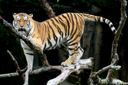

In [5]:
from fastdownload import download_url
# Creating a destination to save an image
dest = 'images/tiger.jpg'
# Downloading the image and saving it inside the destination
download_url(ims[0], dest, show_progress=False)

from fastai.vision.all import *
im = Image.open(dest)
im.to_thumb(128,128)

Now we create all the search terms. They represent the different feline types we are interested in.

In [6]:
feline_types = 'tiger', 'cheetah', 'serval'
path = Path('feline_types')

We create a folder for each feline type. This is where we will save the related images.

Example:
The folder 'feline_types/tiger' will contains all the images of tigers.

In [7]:
if not path.exists():
  path.mkdir()
  for feline in feline_types:
    dest = (path/feline)
    dest.mkdir(exist_ok=True)
    download_images(dest, urls=search_images(f'{feline} animal'))

We verify the download images to see if they are valid (not corrupted for instance).

We delete the invalid files.

In [8]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
len(failed)

9

# Step 2: Preparing the data for Training

# DataBlock

We won't dive too much about datablocks at the moment. This will be done in future notebooks.

For now, we mainly have to understand the following. The data needs to be prepared for the training stage.

The model input consists of images -> ImageBlock
The model output consists of categories -> CategoryBlock

In [9]:
felines = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128)
)

In [10]:
dls = felines.dataloaders(path)

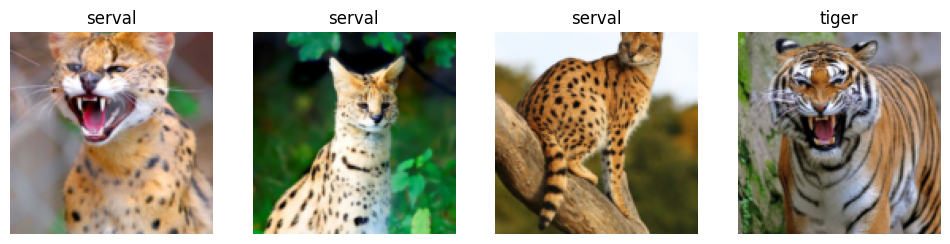

In [11]:
dls.valid.show_batch(max_n=4, nrows=1)

In [12]:
# Experimenting with a few resizing options

'''felines = felines.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = felines.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)'''

'felines = felines.new(item_tfms=Resize(128, ResizeMethod.Squish))\ndls = felines.dataloaders(path)\ndls.valid.show_batch(max_n=4, nrows=1)'

In [13]:
'''felines = felines.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = felines.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)'''

"felines = felines.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))\ndls = felines.dataloaders(path)\ndls.valid.show_batch(max_n=4, nrows=1)"

In [14]:
'''felines = felines.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = felines.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)'''

'felines = felines.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))\ndls = felines.dataloaders(path)\ndls.train.show_batch(max_n=4, nrows=1, unique=True)'

In [15]:
'''felines = felines.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = felines.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)'''

'felines = felines.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))\ndls = felines.dataloaders(path)\ndls.train.show_batch(max_n=8, nrows=2, unique=True)'

We don't have a lot of data for our problem (150 pictures of each sort of felines at most), so to train our model, we'll use RandomResizedCrop with an image size of 224 px, which is fairly standard for image classification, and default aug_transforms:

In [16]:
felines = felines.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms()
)
dls = felines.dataloaders(path)

In [18]:
# Fine_tuning the model for 3-4 epochs
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 180MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.712830,0.642208,0.333333,00:12


epoch,train_loss,valid_loss,error_rate,time
0,0.889354,0.413997,0.200000,00:12
1,0.622880,0.226434,0.088889,00:11
2,0.474464,0.135294,0.044444,00:11
3,0.376947,0.104514,0.022222,00:12


Now let's see the mistakes made by the model. To visualize this, we can create a confusion matrix:

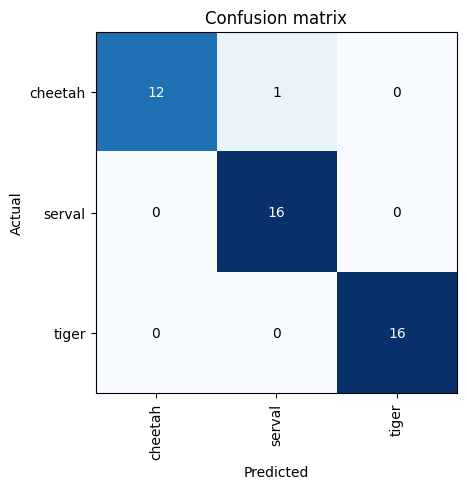

In [19]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

We want to see the top 5 records with the worst predictions. The worst predictions are:



*   Bad predictions where the model was really confident (high probability)
*   Good predictions where the model was not really confident (low probability)



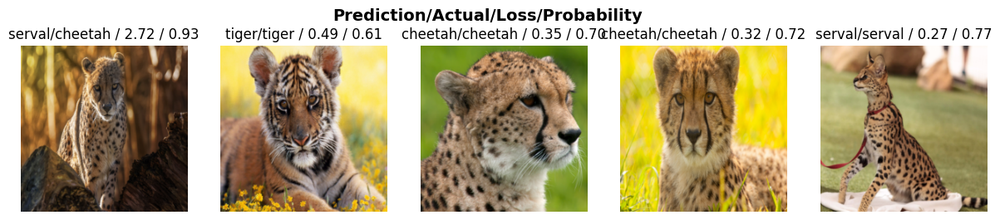

In [20]:
interp.plot_top_losses(5, nrows=1)

The "cleaner" is an interface that we use to clean the data. We visually inspect the images, and change the labels ourselfs if needed. We can even decide to delete an image if we think it isn't related to the task at hand.

In [22]:
from fastai.vision.all import *
from fastai.vision.widgets import ImageClassifierCleaner # imports ImageClassifierCleaner from fastai.vision.widgets

#assigns ImageClassifierCleaner from fastai.vision.widgets to the cleaner variable.
cleaner = ImageClassifierCleaner(learn)
cleaner

After the cleaning step, we update the folders accordingly.

In [23]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [24]:
# Recreating dataloaders
dls = felines.dataloaders(path)

In [27]:
# Training the model again with the "clean" data
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,time
0,2.023009,2.485149,0.577778,00:11


epoch,train_loss,valid_loss,error_rate,time
0,1.020287,1.046545,0.422222,00:12
1,0.716600,0.336587,0.111111,00:12
2,0.516380,0.107701,0.066667,00:12
3,0.408735,0.050837,0.022222,00:11
4,0.342624,0.038830,0.000000,00:12


After retraining the model (this time for 5 epochs), we end up with a model that is **theoretically** 100% accurate.

Error_rate = 0.000

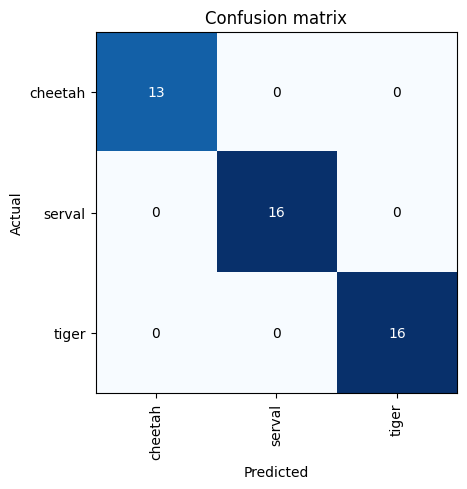

In [28]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

# Exporting the model

Now we can export save the model in a pickle file. This is the file that we'll use when deploying the app.

In [29]:
learn.export()

In [30]:
path = Path()
path.ls(file_exts=".pkl")

(#1) [Path('export.pkl')]

In [31]:
model = load_learner(path/'export.pkl')

In [32]:
# Quick prediction test based on a previous downloaded image.
%time model.predict('images/tiger.jpg')

CPU times: user 163 ms, sys: 6.45 ms, total: 169 ms
Wall time: 270 ms


('tiger', tensor(2), tensor([1.1513e-05, 8.5513e-06, 9.9998e-01]))

In [33]:
model.dls.vocab

['cheetah', 'serval', 'tiger']